In [2]:
!pip install -e ..

Obtaining file:///home/kaicohrs/Repositories/dml-4-fluxes/scripts
ERROR: file:///home/kaicohrs/Repositories/dml-4-fluxes/scripts does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.

[notice] A new release of pip available: 22.2 -> 22.2.2
[notice] To update, run: pip install --upgrade pip


In [1]:
# Imports
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')

import numpy as np

import matplotlib.pyplot as plt
import scipy.stats as stats

import pandas as pd
from sklearn.metrics import r2_score

#from dml4fluxes.experiments import experiment, experiment_utils
from dml4fluxes.analysis.visualization import *
from dml4fluxes.datasets.preprocessing import *
from dml4fluxes.analysis.postprocessing import *

import json

results_path = '/home/kaicohrs/Repositories/dml-4-fluxes/results'

In [2]:
## For each dataset from the thing do:
### Load the data
### Add NN predictions
### Add DML predictions
### Add generated data
### Store on desktop

In [3]:
data_folder = Path.cwd().parent.parent.joinpath('data')
sites = get_available_sites(path= data_folder.joinpath('Fluxnet-2015'))


In [7]:
site = 'FI-Hyy'
data_dml = pd.read_csv(data_folder.joinpath('Fluxnet-2015', 'DMLPartitioning', 'FPDML_all_2023-02-02_15', f'FLX_{site}', 'orth_partitioning.csv'))


In [8]:
data_dml

,DateTime,GPP_orth,RECO_orth,RECO_orth_res,NEE_orth,T_orth,LUE_orth,T,alpha,beta
0,1996-01-01 00:15:00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN
1,1996-01-01 00:45:00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN
2,1996-01-01 01:15:00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN
3,1996-01-01 01:45:00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN
4,1996-01-01 02:15:00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
333115,2014-12-31 21:45:00,NaN,NaN,NaN,NaN,NaN,NaN,0.09,NaN,NaN
333116,2014-12-31 22:15:00,NaN,NaN,NaN,NaN,NaN,NaN,0.52,NaN,NaN
333117,2014-12-31 22:45:00,NaN,NaN,NaN,NaN,NaN,NaN,1.09,NaN,NaN
333118,2014-12-31 23:15:00,NaN,NaN,NaN,NaN,NaN,NaN,1.20,NaN,NaN


In [26]:
data_folder = Path.cwd().parent.parent.joinpath('data')
sites = get_available_sites(path= data_folder.joinpath('Fluxnet-2015'))

for site in sites:
#site = 'FI-Hyy'
    data = load_data(site, 
                    year=2015, add_ann=True, 
                    files_path=False)

    data_dml = pd.read_csv(data_folder.joinpath('Fluxnet-2015', 'DMLPartitioning', 'FPDML_all_2023-02-02_15', f'FLX_{site}', 'orth_partitioning.csv'))
    data['Rect_Hyp'] = data_dml['T']
    data['GPP_DML'] = data_dml['GPP_orth']
    data['RECO_DML'] = data_dml['RECO_orth']
    data['NEE_DML'] = data_dml['NEE_orth']


    data = unwrap_time(data)
    data = data.set_index('DateTime')
    data['DateTime'] = data.index

    extra_data = data.copy()

    extra_data = standardize_column_names(extra_data)
    extra_data = extra_data[list(set(extra_data.columns)
                            & set(relevant_variables.variables))]
    extra_data = NEE_quality_masks(extra_data)

    extra_data['SW_POT_sm'] = sw_pot_sm(extra_data)
    extra_data['SW_POT_sm_diff'] = sw_pot_sm_diff(extra_data)
    extra_data['CWD'] = wdefcum(extra_data)
    extra_data['SW_ratio'] = diffuse_to_direct_rad(extra_data)
    extra_data["doy"] = pd.to_datetime(extra_data['DateTime']).dt.dayofyear
    extra_data["tod"] = pd.to_datetime(extra_data['DateTime']).dt.hour*60 + pd.to_datetime(extra_data['DateTime']).dt.minute
    extra_data["doy_sin"], extra_data["doy_cos"] = make_cyclic(extra_data["doy"])
    extra_data["tod_sin"], extra_data["tod_cos"] = make_cyclic(extra_data["tod"])

    #extra_data['GPP_prox']= GPP_prox(extra_data)
    #extra_data['WD_sin'], extra_data['WD_cos'] = WD_trans(extra_data)
    extra_data['NEE_NT'] = -extra_data['GPP_NT'] + extra_data['RECO_NT']
    extra_data['NEE_DT'] = -extra_data['GPP_DT'] + extra_data['RECO_DT']

    # Generate mask for quality of all extra_data to be used.
    #extra_data['QC'] = quality_check(extra_data, X_var + W_var + ['SW_IN'])

    # Drop problematic rows
    #extra_data = extra_data.replace(-9999, np.nan)

    extra_data = synthetic_dataset(data=extra_data,
                                Q10=1.5,
                                relnoise=0,
                                version='simple',
                                pre_computed=True,
                                site_name=site)
    extra_data = extra_data[~pd.isna(extra_data[['NEE_syn'] + ['NEE_syn_clean']]).any(axis=1)]
    for col in ['NEE_syn', 'RECO_syn', 'GPP_syn', 'SW_POT_sm', 'SW_POT_sm_diff']:
        data[col]=extra_data[col]

    del data['DateTime']  

    data.to_csv(f"~/Desktop/Fluxnet2015Data/FLX_{site}_FLUXNET2015_FULLSET_HH_plus.csv")


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [25]:
data['DateTime']

DateTime
2007-01-01 00:15:00   2007-01-01 00:15:00
2007-01-01 00:45:00   2007-01-01 00:45:00
2007-01-01 01:15:00   2007-01-01 01:15:00
2007-01-01 01:45:00   2007-01-01 01:45:00
2007-01-01 02:15:00   2007-01-01 02:15:00
                              ...        
2013-12-31 21:45:00   2013-12-31 21:45:00
2013-12-31 22:15:00   2013-12-31 22:15:00
2013-12-31 22:45:00   2013-12-31 22:45:00
2013-12-31 23:15:00   2013-12-31 23:15:00
2013-12-31 23:45:00   2013-12-31 23:45:00
Name: DateTime, Length: 122736, dtype: datetime64[ns]

# FR-LBr 2008, See August first days the VPD increase 

Filter out according to relevant_variables.


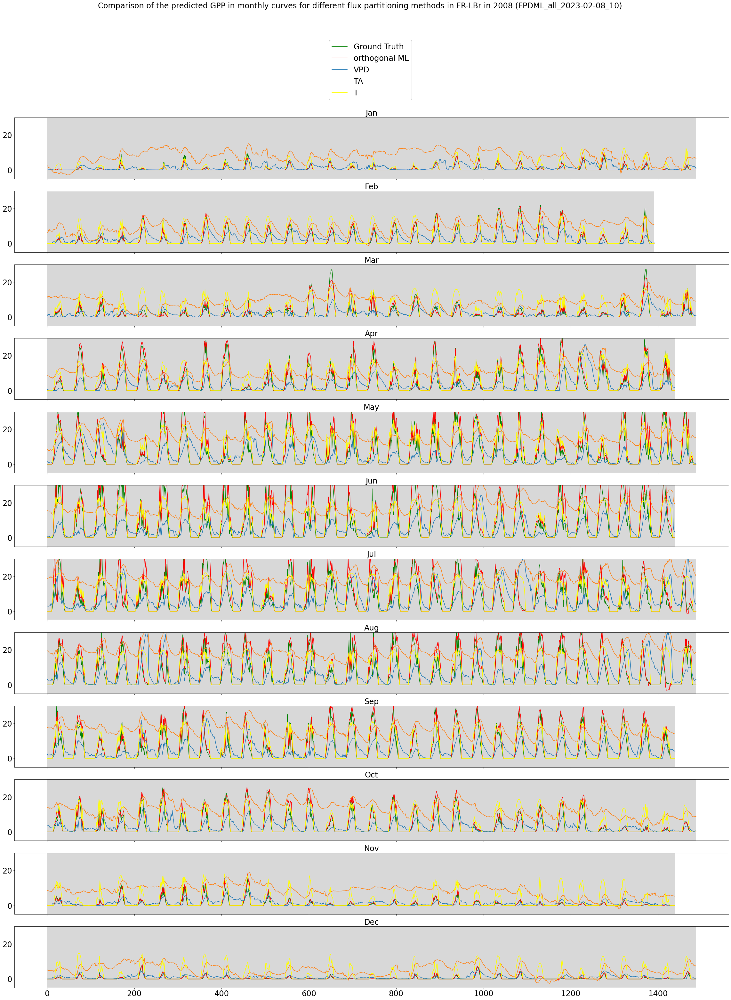

In [4]:

monthly_curves(site='FR-LBr', year=2008, flux='GPP', experiment_name="FPDML_all_2023-02-08_10", syn=True, input=['VPD', 'TA', 'T'])

In [ ]:
monthly_curves(site='FR-LBr', year=2008, flux='GPP', experiment_name='FPDML_FR-LBr_2023-02-06_6', syn=False, input=['VPD', 'TA', 'T', 'SWC_1', 'WS'])

In [ ]:
monthly_curves(site='FR-LBr', year=2008, flux='GPP', experiment_name='FPDML_FR-LBr_2023-02-06_6', syn=False, input=['VPD', 'TA', 'T', 'SWC_1', 'WS'])

Filter out according to relevant_variables.


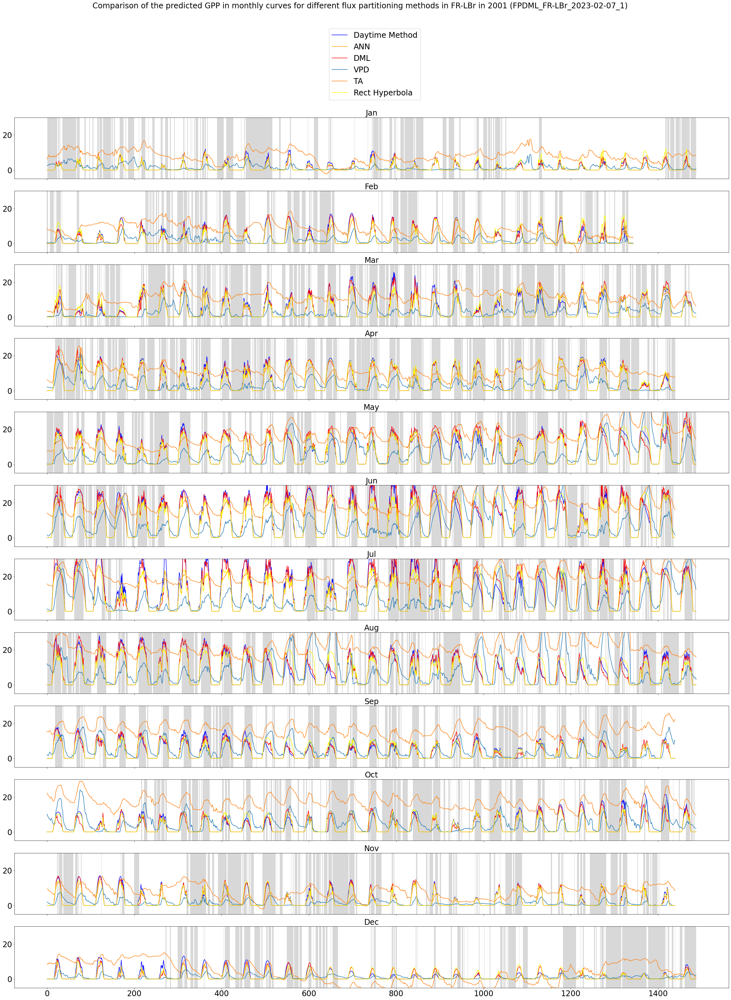

In [32]:
monthly_curves(site='FR-LBr', year=2001, flux='GPP', experiment_name='FPDML_FR-LBr_2023-02-07_1', syn=False, input=['VPD', 'TA', 'T'],path=results_path) # 'FPDML_US-SRG_2023-02-07_6'

# US-Srg 2010, See rain pulse July 

Filter out according to relevant_variables.


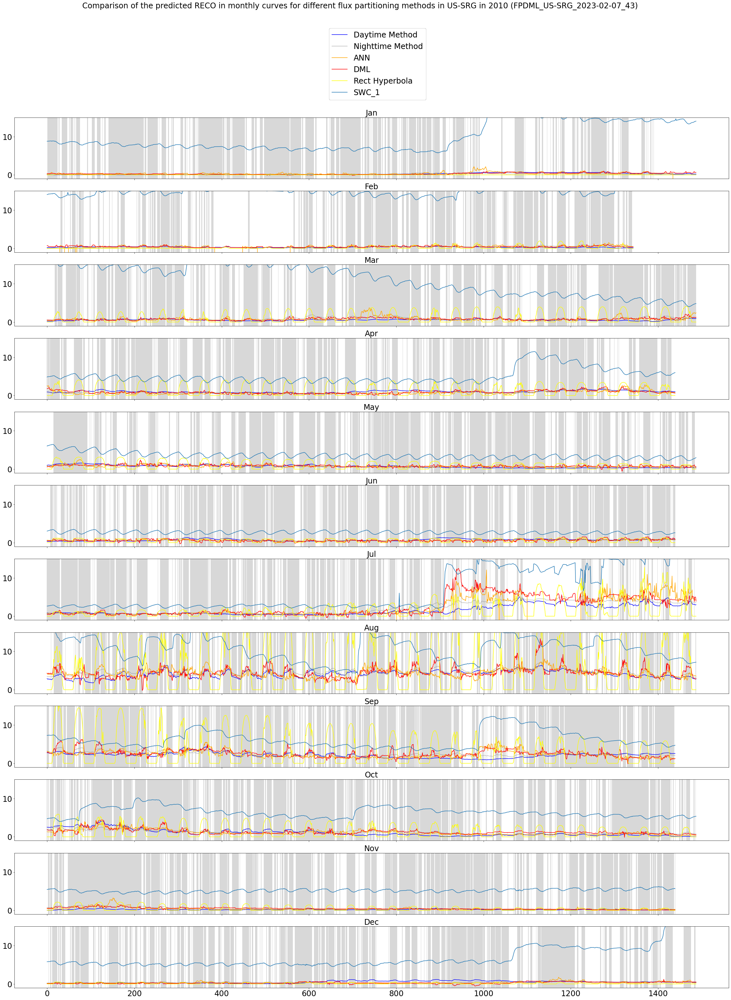

In [5]:
data = monthly_curves(site='US-SRG', year=2010, flux='RECO', experiment_name='FPDML_US-SRG_2023-02-07_43', syn=False, input=['T', 'SWC_1'], path=results_path) # 'FPDML_US-SRG_2023-02-07_6'

Filter out according to relevant_variables.


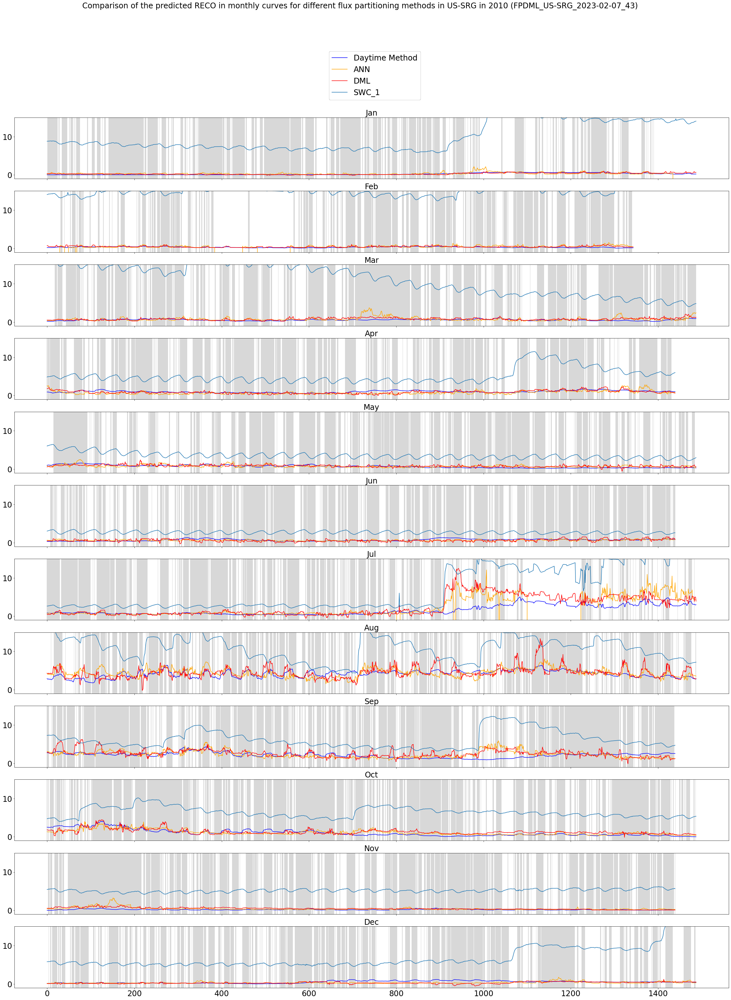

In [33]:
data = monthly_curves(site='US-SRG', year=2010, flux='RECO', experiment_name='FPDML_US-SRG_2023-02-07_43', syn=False, input=['SWC_1'], path=results_path) # 'FPDML_US-SRG_2023-02-07_6'

Filter out according to relevant_variables.


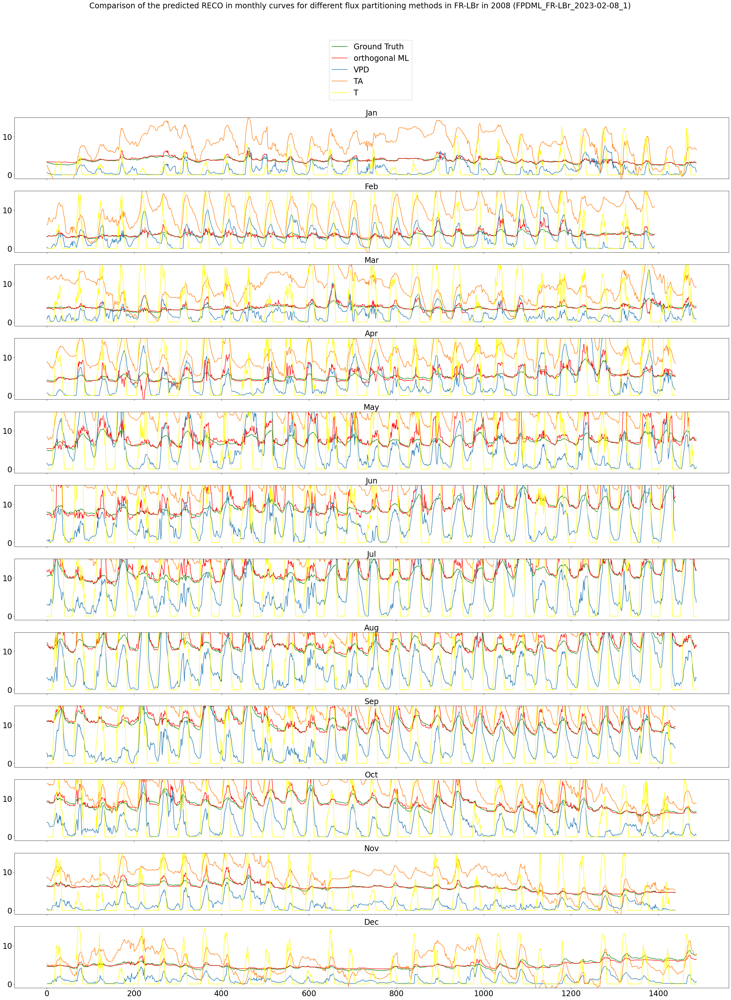

In [14]:
data = monthly_curves(site='FR-LBr', year=2008, flux='RECO', experiment_name='FPDML_FR-LBr_2023-02-08_1', syn=True, input=['VPD', 'TA', 'T']) # 'FPDML_US-SRG_2023-02-07_6'

# US-Srg 2009, See rain pulse July 

# Check relationships between variables

In [34]:
#data = unwrap_time(data)
#data = data.set_index('DateTime')
#data['DateTime'] = data.index
data = standardize_column_names(data)
data = data[list(set(data.columns)
                        & set(relevant_variables.variables))]
data = NEE_quality_masks(data)

data['SW_POT_sm'] = sw_pot_sm(data)
data['SW_POT_sm_diff'] = sw_pot_sm_diff(data)
data['CWD'] = wdefcum(data)

AttributeError: 'NoneType' object has no attribute 'copy'

In [ ]:
plt.scatter(exp.data['TA'], exp.data['VPD'], c=exp.data['LUE_orth'])
plt.colorbar(label="Lue_orth", orientation="horizontal")

In [39]:
X = np.zeros([10000,2])
value1 = np.dstack(np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))).reshape(-1, 2)[:,0]
value2 = np.dstack(np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))).reshape(-1, 2)[:,1]
X[:,0] = value1
X[:,1] = value2


In [30]:
['TA_s', 'SWC_1_s','VPD_s','SWC_2_s', 'WS_s']

['TA_s', 'SWC_1_s', 'VPD_s', 'SWC_2_s', 'WS_s']

In [40]:
plt.scatter(value1, value2, c=exp.fitted_models['2009'].lue(X))
plt.colorbar(label="Lue_orth", orientation="horizontal")

NameError: name 'exp' is not defined

In [38]:
southern_hemisphere = ["AU-Cpr",
                            "AU-DaP",
                            "AU-Dry",
                            "AU-How",
                            "AU-Stp",
                            "ZA-Kru",
                            "GF-Guy"] #Northern hemisphere but still filtered out due to lat < 5
DML = DML.loc[~np.isin(DML['site'],southern_hemisphere),:]

only_one_year = ["IT-Cpz",
                    "Be-Lon",
                    "IT-Ro1",
                    "US-ARM",
                    "US-MMS",
                    "US-UMB"]
DML = DML.loc[~np.isin(DML['site'],only_one_year),:]

In [39]:
DML = DML.drop(columns = ['VPD_n', 'SW_ratio',
       'wdefcum', 'NEE_orth', 'VPD',
       'SW_POT_sm_diff', 'SW_IN', 'Q10',
       'LUE_orth', 'code', 'TA_n',
       'QC', 'NIGHT',
       'quality_mask', 'wdefcum_n', 'SW_POT_sm', 'Rb', 'TA'])

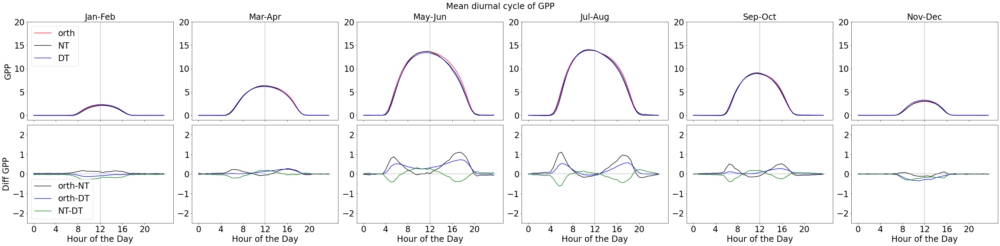

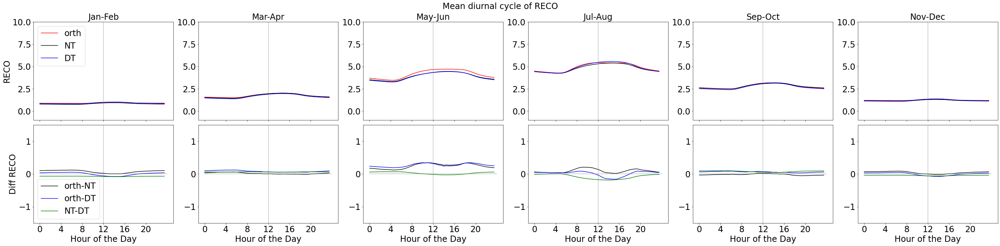

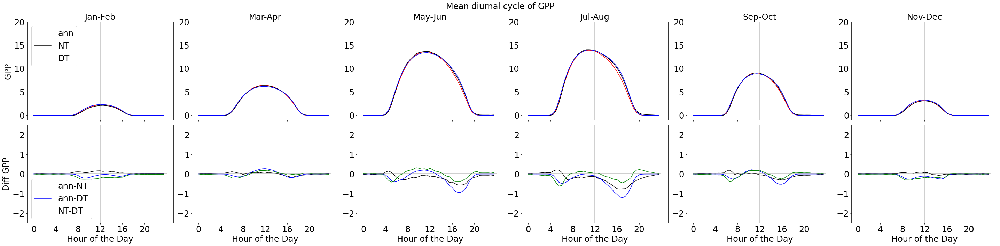

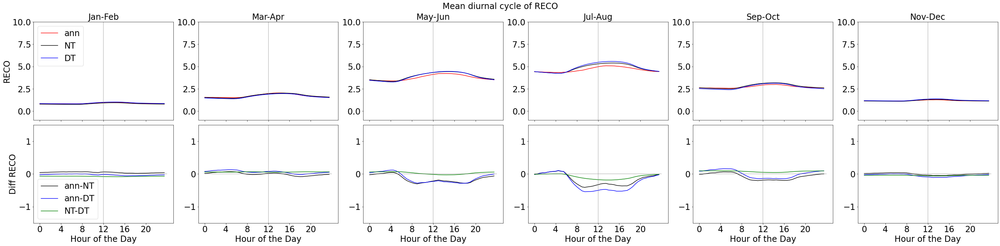

In [40]:
for method in ['orth', 'ann']:
    mean_diurnal_cycle(DML, 'GPP', '/home/kaicohrs/Repositories/results/DML_sota/images/' , method=method)
    mean_diurnal_cycle(DML, 'RECO', '/home/kaicohrs/Repositories/results/DML_sota/images/', method=method)

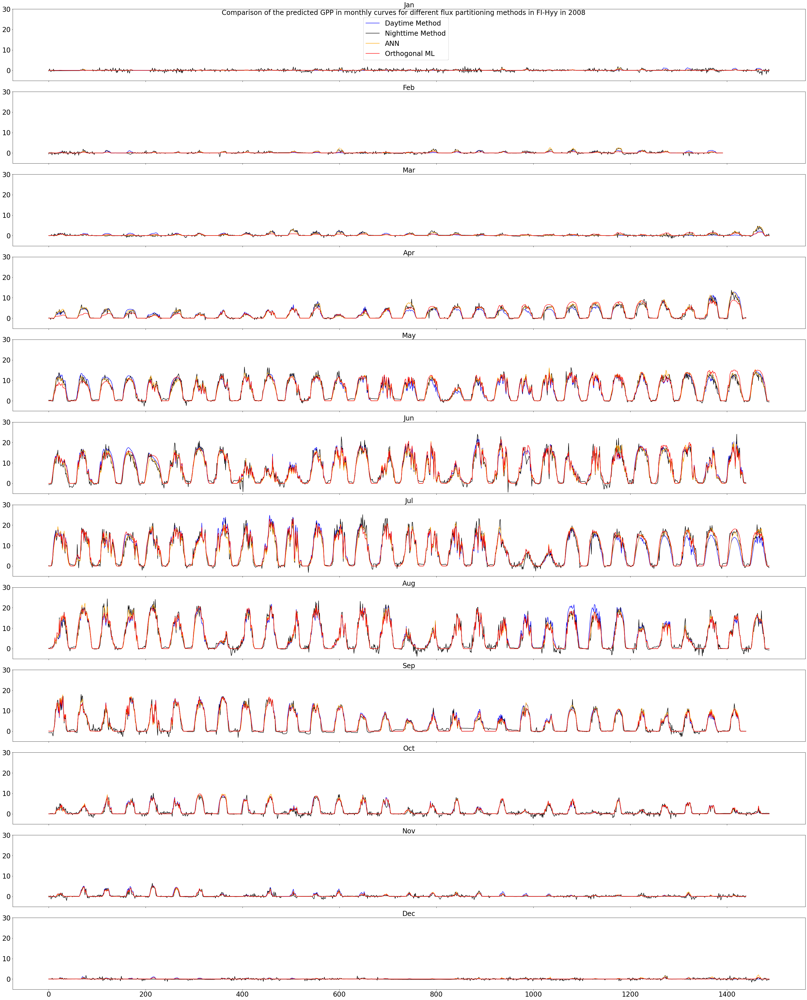

In [12]:
monthly_curves(DML, site="FI-Hyy", year=2008, flux="GPP", res=False)

# Latex code for results

In [57]:
path = '/home/kaicohrs/Repositories/results/DML_sota/'
files = ['results_all_ann.csv', 'results_all_orth.csv']


In [58]:
ann_table = pd.read_csv(path + files[0])
orth_table = pd.read_csv(path + files[1])


In [62]:
results = pd.DataFrame(columns = ["method", "flux", "R2", "RMSE"])

In [63]:
orth = orth_table.round(2).drop(axis=0, labels=[1,5,9])
results["R2"] = orth.apply(lambda x : str(x["R2_med"]) + " (" + str(x["R2_25"]) + "/" + str(x["R2_75"]) + ")", axis=1)
results["RMSE"] = orth.apply(lambda x : str(x["MSE_med"]) + " (" + str(x["MSE_25"]) + "/" + str(x["MSE_75"]) + ")", axis=1)

results["method"] = ["DT-Orth", "DT-Orth", "DT-Orth", "NT-Orth", "NT-Orth", "NT-Orth", "NT-DT", "NT-DT", "NT-DT"]
results["flux"] = ["RECO", "GPP", "NEE", "RECO", "GPP", "NEE", "RECO", "GPP", "NEE"]


In [64]:
results

,method,flux,R2,RMSE
0,DT-Orth,RECO,0.61 (0.42/0.71),1.37 (0.92/1.74)
2,DT-Orth,GPP,0.95 (0.93/0.97),1.43 (0.92/1.78)
3,DT-Orth,NEE,0.96 (0.93/0.97),1.11 (0.76/1.36)
4,NT-Orth,RECO,0.7 (0.52/0.81),0.99 (0.67/1.31)
6,NT-Orth,GPP,0.9 (0.85/0.92),2.27 (1.36/2.71)
7,NT-Orth,NEE,0.87 (0.81/0.9),2.08 (1.27/2.56)
8,NT-DT,RECO,0.7 (0.58/0.8),1.18 (0.84/1.4)
10,NT-DT,GPP,0.89 (0.82/0.91),2.26 (1.45/2.77)
11,NT-DT,NEE,0.86 (0.78/0.89),1.95 (1.25/2.51)


In [ ]:
orth = orth_table.round(2).drop(axis=0, labels=[1,5,8,9,10,11])
results["R2_orth"] = orth.apply(lambda x : str(x["R2_med"]) + " (" + str(x["R2_25"]) + "/" + str(x["R2_75"]) + ")", axis=1)
results["RMSE_orth"] = orth.apply(lambda x : str(x["MSE_med"]) + " (" + str(x["MSE_25"]) + "/" + str(x["MSE_75"]) + ")", axis=1)

ann = ann_table.round(2).drop(axis=0, labels=[1,5,8,9,10,11])
results["R2_ann"] = ann.apply(lambda x : str(x["R2_med"]) + " (" + str(x["R2_25"]) + "/" + str(x["R2_75"]) + ")", axis=1)
results["RMSE_ann"] = ann.apply(lambda x : str(x["MSE_med"]) + " (" + str(x["MSE_25"]) + "/" + str(x["MSE_75"]) + ")", axis=1)

results["method"] = ["DT", "DT", "DT", "NT", "NT", "NT"]
results["flux"] = ["RECO", "GPP", "NEE", "RECO", "GPP", "NEE"]


In [65]:
print(results.to_latex(index=False))

\begin{tabular}{llll}
\toprule
 method & flux &               R2 &             RMSE \\
\midrule
DT-Orth & RECO & 0.61 (0.42/0.71) & 1.37 (0.92/1.74) \\
DT-Orth &  GPP & 0.95 (0.93/0.97) & 1.43 (0.92/1.78) \\
DT-Orth &  NEE & 0.96 (0.93/0.97) & 1.11 (0.76/1.36) \\
NT-Orth & RECO &  0.7 (0.52/0.81) & 0.99 (0.67/1.31) \\
NT-Orth &  GPP &  0.9 (0.85/0.92) & 2.27 (1.36/2.71) \\
NT-Orth &  NEE &  0.87 (0.81/0.9) & 2.08 (1.27/2.56) \\
  NT-DT & RECO &   0.7 (0.58/0.8) &  1.18 (0.84/1.4) \\
  NT-DT &  GPP & 0.89 (0.82/0.91) & 2.26 (1.45/2.77) \\
  NT-DT &  NEE & 0.86 (0.78/0.89) & 1.95 (1.25/2.51) \\
\bottomrule
\end{tabular}



In [41]:
print(results.to_latex(index=False))

\begin{tabular}{llllll}
\toprule
method & flux &          R2\_orth &           R2\_ann &         MSE\_orth &          MSE\_ann \\
\midrule
    DT & RECO & 0.61 (0.42/0.71) & 0.66 (0.49/0.77) & 1.86 (0.84/3.03) & 1.47 (0.71/2.39) \\
    DT &  GPP & 0.95 (0.93/0.97) & 0.94 (0.92/0.96) & 2.04 (0.84/3.18) & 2.32 (1.16/3.39) \\
    DT &  NEE & 0.96 (0.93/0.97) & 0.94 (0.91/0.96) & 1.24 (0.57/1.85) & 1.56 (0.78/2.36) \\
    NT & RECO &  0.7 (0.52/0.81) &  0.82 (0.64/0.9) & 0.97 (0.45/1.72) & 0.62 (0.28/1.02) \\
    NT &  GPP &  0.9 (0.85/0.92) & 0.93 (0.89/0.95) & 5.17 (1.84/7.35) & 3.15 (1.06/4.86) \\
    NT &  NEE &  0.87 (0.81/0.9) & 0.93 (0.89/0.94) & 4.32 (1.63/6.54) & 2.21 (0.83/3.86) \\
\bottomrule
\end{tabular}



In [21]:
import ast

In [11]:
path = "/home/kaicohrs/Repositories/dml-4-fluxes/results/noise_levels/"


In [115]:
table_R2 = pd.DataFrame(columns = ["rel_noise", "R2_GPP", "R2_RECO", "R2_NEE_clean"])
table_RMSE = pd.DataFrame(columns = ["rel_noise", "RMSE_GPP", "RMSE_RECO",  "RMSE_NEE_clean", "RMSE_NEE"])

row = dict()

In [116]:
results_table

,R2_med,R2_25,R2_75,RMSE_med,RMSE_25,RMSE_75
Unnamed: 0,,,,,,
RECO,0.940,0.923,0.960,0.861,0.770,1.104
RECO_res,0.994,0.990,0.995,0.320,0.227,0.454
GPP,0.997,0.994,0.998,0.320,0.227,0.454
NEE,0.978,0.973,0.983,0.872,0.768,1.079
NEE_clean,0.978,0.973,0.983,0.872,0.768,1.079


In [117]:
for file in os.listdir("/home/kaicohrs/Repositories/dml-4-fluxes/results/noise_levels/"):
    with open(path + file + '/dataset_config.txt') as f:
        config = f.readlines()[0]
    noise = float(config.split('relnoise": ')[1].split(', "pre_computed')[0])
    results_table = pd.read_csv(path + file + "/results_all_orth.csv").round(3).set_index("Unnamed: 0")
    row = dict()
    row["rel_noise"] = noise
    mes = "R2"
    for flux in ["GPP", "RECO", "NEE_clean"]:
        row[mes + "_" + flux] = str(results_table.loc[flux, mes + "_med"]) + " (" + str(results_table.loc[flux, mes + "_25"]) + "/" + str(results_table.loc[flux, mes + "_75"]) + ")"
    table_R2 = table_R2.append(row, ignore_index=True)
    row = dict()
    
    row["rel_noise"] = noise
    mes = "RMSE"
    for flux in ["GPP", "RECO", "NEE_clean"]:
        row[mes + "_" + flux] = str(results_table.loc[flux, mes + "_med"]) + " (" + str(results_table.loc[flux, mes + "_25"]) + "/" + str(results_table.loc[flux, mes + "_75"]) + ")"
    flux = "NEE"
    row[mes + "_" + flux] = str(results_table.loc[flux, mes + "_med"]) + " (" + str(results_table.loc[flux, mes + "_25"]) + "/" + str(results_table.loc[flux, mes + "_75"]) + ")"
    table_RMSE = table_RMSE.append(row, ignore_index=True)
    


In [118]:
print(table_RMSE.sort_values("rel_noise").to_latex())

\begin{tabular}{lrllll}
\toprule
{} &  rel\_noise &             RMSE\_GPP &            RMSE\_RECO &       RMSE\_NEE\_clean &                RMSE\_NEE \\
\midrule
7 &       0.00 &   0.32 (0.227/0.454) &   0.861 (0.77/1.104) &  0.872 (0.768/1.079) &     0.872 (0.768/1.079) \\
1 &       0.05 &   0.33 (0.234/0.467) &  0.864 (0.771/1.109) &   0.873 (0.77/1.083) &     1.029 (0.827/1.311) \\
6 &       0.10 &  0.359 (0.243/0.491) &  0.878 (0.778/1.136) &    0.88 (0.77/1.097) &     1.197 (0.949/1.615) \\
4 &       0.20 &    0.401 (0.284/0.6) &  0.921 (0.794/1.184) &  0.898 (0.781/1.128) &     1.701 (1.346/2.573) \\
5 &       0.40 &  0.515 (0.386/0.772) &  0.973 (0.825/1.335) &  0.941 (0.808/1.219) &      2.977 (2.349/4.85) \\
2 &       0.70 &  0.758 (0.543/1.152) &  1.139 (0.895/1.577) &  1.025 (0.862/1.358) &     5.101 (3.965/8.434) \\
0 &       1.00 &  1.005 (0.715/1.589) &  1.285 (0.971/1.872) &  1.147 (0.927/1.467) &    7.162 (5.583/11.949) \\
3 &       2.00 &  1.804 (1.268/2.972) &   1.88 

In [70]:
results_table.loc["GPP", "R2_med"]

In [68]:
results_table = results_table.round(2).set_index("Unnamed: 0")

In [20]:
import configparser
import io

s_config = config[0]
buf = io.StringIO(s_config)
config = configparser.ConfigParser()
config.read_file(buf)

MissingSectionHeaderError: File contains no section headers.
file: '<???>', line: 1
'{"site_name": "all", "syn": true, "version": "simple", "Q10": 1.5, "relnoise": 0, "pre_computed": true, "transform_T": false, "month_wise": true, "delta": "heuristic3", "X": ["VPD", "TA"], "W": ["SW_POT_sm", "SW_POT_sm_diff"], "years": "all", "norm_type": "standardize"}'

In [41]:
results.keys()

dict_keys(['R2_all_orth', 'R2_all_ann', 'R2_day_orth', 'R2_day_ann', 'R2_night_orth', 'R2_night_ann', 'MSE_all_orth', 'MSE_all_ann', 'MSE_day_orth', 'MSE_day_ann', 'MSE_night_orth', 'MSE_night_ann'])